# Importing

In [853]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import sklearn
from sklearn.datasets.samples_generator import make_blobs, make_moons
from collections import OrderedDict

In [856]:
import hdbscan

# Generating Dataset

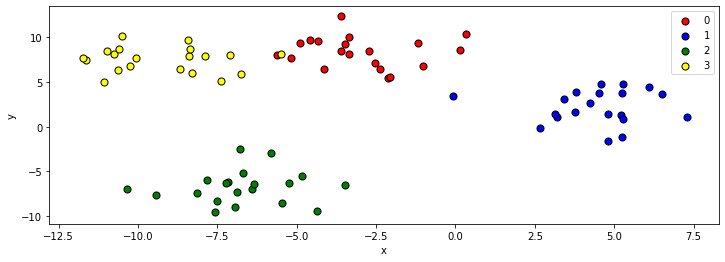

In [475]:
# generate 2d classification dataset
X, y = make_blobs(n_samples=80, centers=4, n_features=2, cluster_std=1.8, random_state=42)

# scatter plot, dots colored by class value
df = pd.DataFrame(dict(x=X[:,0], y=X[:,1], label=y))
colors = {0:'red', 1:'blue', 2:'green', 3:'yellow'}
fig, ax = plt.subplots(figsize=(12,4))
grouped = df.groupby('label')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x', y='y', label=key, color=colors[key], s=50, edgecolor="black")
plt.show()

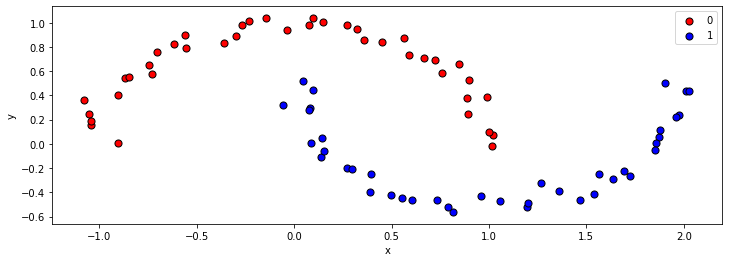

In [501]:
# generate 2d classification dataset
X, y = make_moons(n_samples=80, noise=0.05, random_state=42)

# scatter plot, dots colored by class value
df = pd.DataFrame(dict(x=X[:,0], y=X[:,1], label=y))
colors = {0:'red', 1:'blue', 2:'green', 3:'yellow'}
fig, ax = plt.subplots(figsize=(12,4))
grouped = df.groupby('label')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x', y='y', label=key, color=colors[key], s=50, edgecolor="black")
plt.show()

# OPTICS

## Functions

In [834]:
def point_plot(X_dict, x,y, eps, processed=None, col='yellow'):
    
    fig, ax = plt.subplots(figsize=(14,6))
    
    plt.scatter(X[:,0], X[:,1], s=300, color="lime", edgecolor="black")
    
    if processed is not None:
        for i in processed:
            plt.scatter(X_dict[i][0],X_dict[i][1], color=col, s=300 )
    
    plt.scatter(x=x,y=y,s=400, color="black", alpha=0.4)
    
    circle1 = plt.Circle((x, y), eps, color='r', fill=False, linewidth=3, alpha=0.7)
    plt.gcf().gca().add_artist(circle1)
    
    xmin, xmax, ymin, ymax = plt.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin
    
    xw1 = xwidth*0.008
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.005
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=12, size=12)
        else:
            ax.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=12, size=12)
    
    plt.show()

In [601]:
#point_plot(X_dict, X[0,0], X[0,1], eps=0.3)

In [37]:
# original euclidean distance
def dist1(x,y):   
    return np.sqrt(np.sum((x-y)**2))

In [38]:
# euclidean distance which takes keys of a dictionary (X_dict) as inputs
def dist2(data, x,y):   
    return np.sqrt(np.sum((data[x]-data[y])**2))

In [39]:
# neighborhood search for a point of a given dataset-dictionary (data) with a fixed eps
def scan_neigh1(data, point, eps):
    
    neigh = {}
    distances = {}
    
    for i, element in enumerate(data.values()):
        
        d = dist1(element, point)
        
        if (d <= eps) and (d != 0):
            
            neigh.update({str(i):element})

    return neigh   


In [40]:
# variation that returns only the keys of the input dictionary with the euclidean distances <= eps from the point
def scan_neigh2(data, point, eps):
    
    neigh = {}
    distances = {}
    
    for i, element in enumerate(data.values()):
        
        d = dist1(element, point)
        
        if (d <= eps) and (d != 0):
            
            distances.update({str(i):d})

    d_sorted = sorted(distances.items(), key=lambda x: x[1], reverse=False)

    return d_sorted

In [45]:
# returns the minPTS-distance of a point if it is a core point, else it return np.inf
def minPTSdist(data, o, minPTS, eps):
    
    S = scan_neigh2(data, data[o], eps)
    
    if len(S) >= minPTS-1:
        
        return S[minPTS-2][1]
    
    else:
        
        return np.inf    

In [47]:
#reachability distance (even if it is not a distance because it isn't symmetrical)
def reach_dist(data, x,y, minPTS, eps):
    
    return max(dist2(data, x,y), minPTSdist(data, y, minPTS, eps))

In [233]:
# plots the reachability plot, along with a horizontal line denoting eps, from the ClustDist produced by OPTICS
def Reach_plot(data, ClustDist, eps):
    plot_dic = {}

    for key, value in ClustDist.items():
        
        if np.isinf(value) == True:
            
            plot_dic[key] = eps*1.15
        
        else:
            
            plot_dic[key] = ClustDist[key]
        
    missing_keys = list(set(data.keys())-set(ClustDist.keys()))
    
    tick_list = list(ClustDist.keys()) + [' ']*(len(missing_keys))

    for m_k in missing_keys:

        plot_dic[m_k] = 0
        
    plt.figure(figsize=(8,5))
    plt.bar(plot_dic.keys(),plot_dic.values())
    
    plt.xticks(tick_list)
    
    plt.axhline(eps, color="red", linewidth=3)
    
    plt.annotate("\u03B5", (0.92,0.79), xycoords='figure fraction')

    plt.show()

In [449]:
def OPTICS(X, eps, minPTS, plot=True, plot_reach=False):
    
    ClustDist = {}
    CoreDist = {}
    Seed =  {}
    processed = []
    
    # create dictionary
    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    while len(processed) != len(X):

        if len(Seed) == 0:

                unprocessed = list(set(list(X_dict.keys())) - set(processed))

                (o, r) = (random.choice(unprocessed), np.inf)

        else:

            (o, r) = (min(Seed, key=Seed.get), Seed[min(Seed, key=Seed.get)])

            del Seed[o]

        N = scan_neigh1(X_dict, X_dict[o], eps)

        ClustDist.update({o:r})
        
        CoreDist.update({o: minPTSdist(X_dict, o, minPTS, eps)})
        
        if plot == True:
            
            point_plot(X_dict, X_dict[o][0], X_dict[o][1], eps, processed)
            
            if plot_reach == True:
                
                Reach_plot(X_dict, ClustDist, eps)
        

        processed.append(o)

        if len(N) >= minPTS-1 :

            for n in N:

                if n in processed:

                    continue

                else:

                    p = reach_dist(X_dict, n, o, minPTS, eps)

                    if n in Seed:

                        if p < Seed[n]:

                            Seed[n] = p
                    else:

                        Seed.update({n:p})
    
    return (ClustDist, CoreDist)

In [257]:
#extracts cluster in a DBSCAN fashion; one can use any eps_db <= eps of OPTICS
def ExtractDBSCANclust(ClustDist, CoreDist, eps_db):
    
    Clust_Dict = {}
    
    noise = -1
    
    clust_id = -1
    
    for key, value in ClustDist.items():
        
        if value > eps_db:
            
            if CoreDist[key] <= eps_db:
                
                clust_id += 1
                
                Clust_Dict[key] = clust_id
                
            else:
                
                Clust_Dict[key] = noise
                
        else:
            
            Clust_Dict[key] = clust_id
    
    return Clust_Dict

In [848]:
def plot_clust(X, ClustDist, CoreDist, eps, eps_db):
    
    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    cl = ExtractDBSCANclust(ClustDist, CoreDist, eps_db)

    new_dict = {key: (val1, cl[key]) for key,val1 in zip(list(X_dict.keys()),list(X_dict.values())) }

    new_dict = OrderedDict((k, new_dict[k]) for k in list(ClustDist.keys()))

    df = pd.DataFrame(dict(x = [i[0][0] for i in list(new_dict.values())], 
                 y=[i[0][1] for i in list(new_dict.values())], 
                 label= [i[1]for i in list(new_dict.values())]), index=new_dict.keys())

    colors = {-1:'red', 0:'lightblue', 1:'beige', 2:'yellow', 3:'grey', 
              4:'pink', 5:'navy', 6:'orange', 7:'purple', 8:'salmon', 9:'olive', 10:'brown',
             11:'tan', 12: 'lime'}

    #fig, ax = plt.subplots(figsize=(14,6))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,6))
    
    grouped = df.groupby('label')
    for key, group in grouped:
        group.plot(ax=ax1, kind='scatter', x='x', y='y', label=key, color=colors[key], s=300, edgecolor="black")

    ax1.set_xlabel("")
    ax1.set_ylabel("")
    
    xmin, xmax, ymin, ymax = ax1.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin

    xw1 = xwidth*0.005
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.0025
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax1.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=8, size=10)
        else:
            ax1.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=8, size=10)


    #plt.show()

    plot_dic = {}

    for key, value in ClustDist.items():

        if np.isinf(value) == True:

            plot_dic[key] = eps*1.15

        else:

            plot_dic[key] = ClustDist[key]

    #plt.figure(figsize=(8,5), ax=ax)
    #fig, ax = plt.subplots(figsize=(8,5))
    ax2.bar(plot_dic.keys(),plot_dic.values(), color=[colors[i] for i in df.label], edgecolor="black")

    ax2.axhline(eps, color="black", linewidth=3)

    #plt.annotate("\u03B5", (0.920,0.79), xycoords='figure fraction')

    ax2.axhline(eps_db, color="black", linewidth=3)

    #plt.annotate("\u03B5"+"\'", (438,eps_db*103), xycoords='axes points')
    
    ax3 = ax2.twinx()
    ax3.set_ylim(ax2.get_ylim())
    ax3.set_yticks([eps, eps_db])
    ax3.set_yticklabels(["\u03B5", "\u03B5"+"\'"])

    plt.show()

## Testing

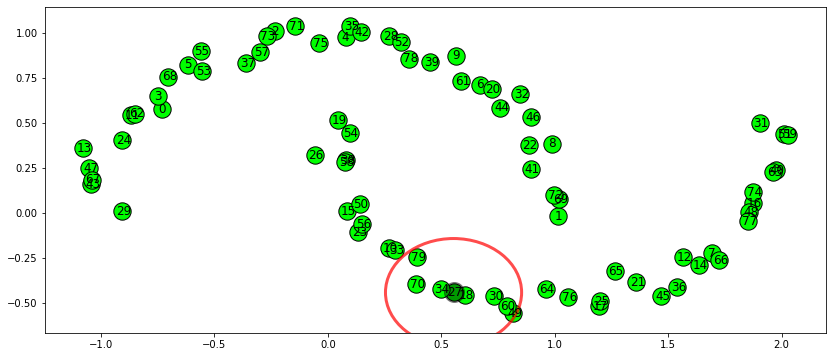

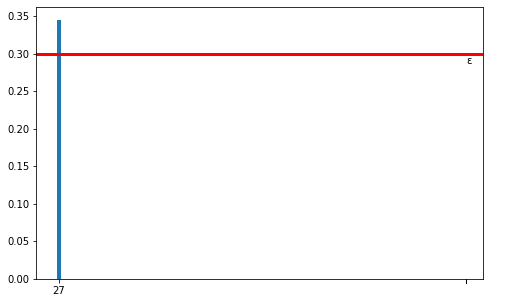

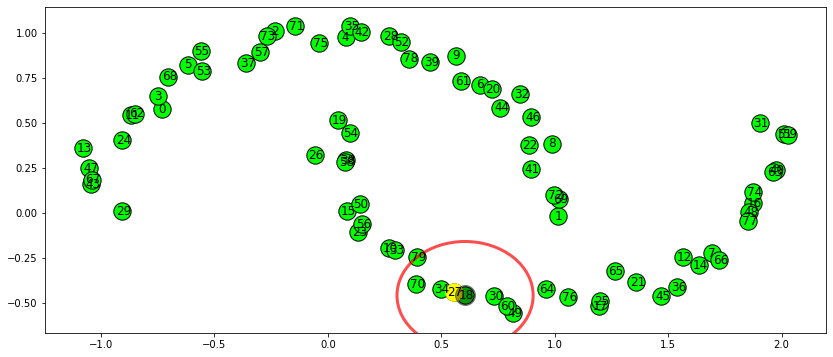

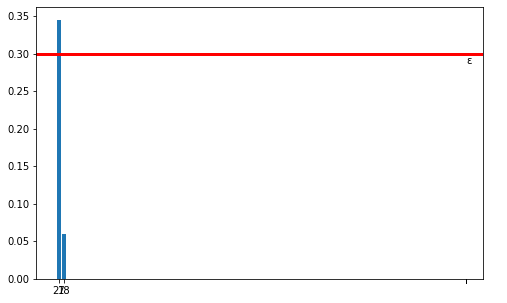

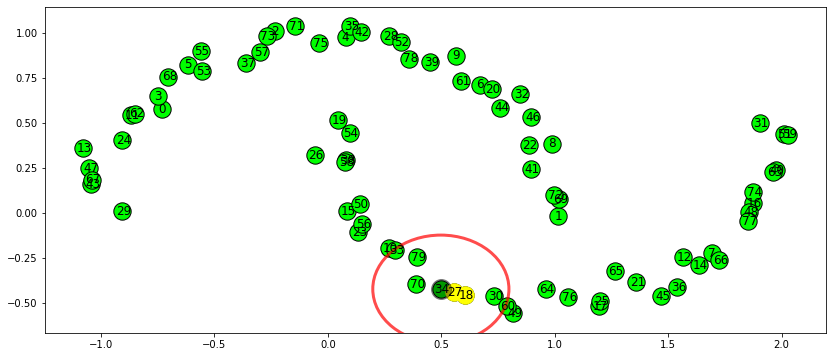

...

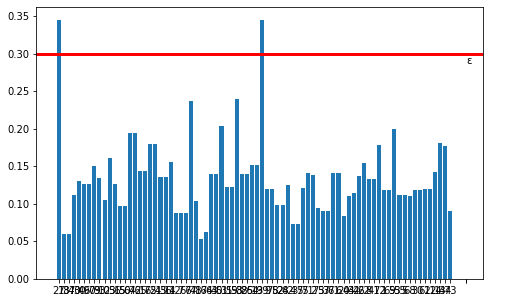

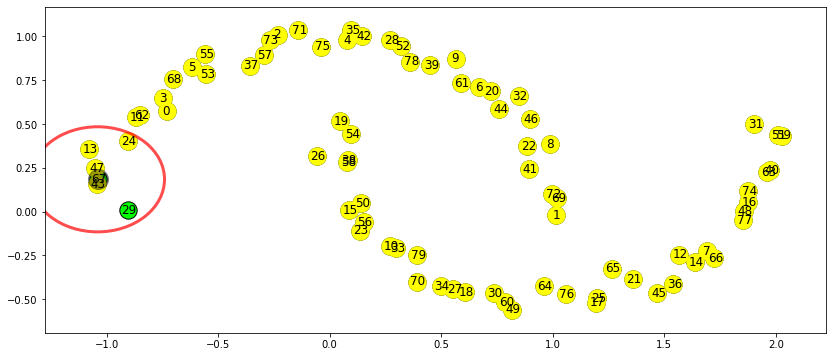

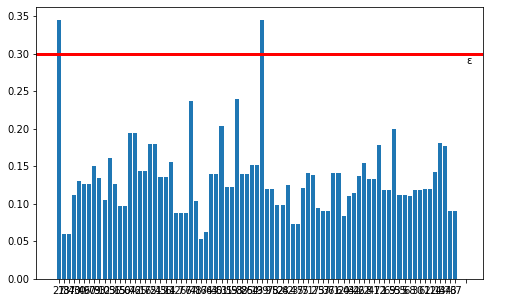

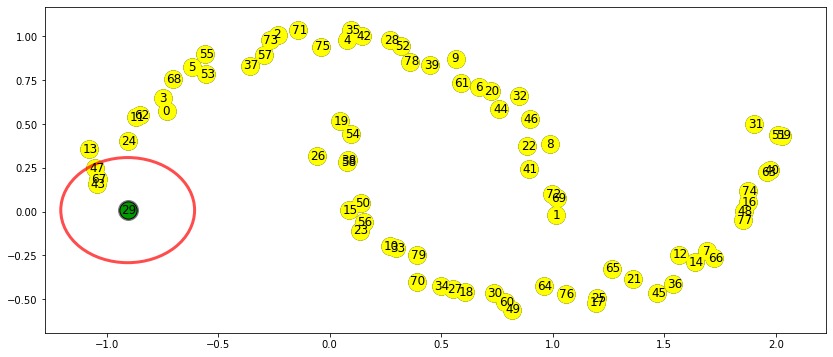

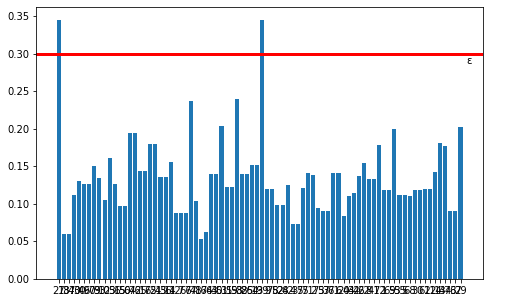

In [847]:
ClustDist, CoreDist = OPTICS(X, eps=0.3, minPTS=3, plot=True, plot_reach=True)

In [844]:
ClustDist, CoreDist = OPTICS(X, eps=0.3, minPTS=3, plot=False, plot_reach=False)

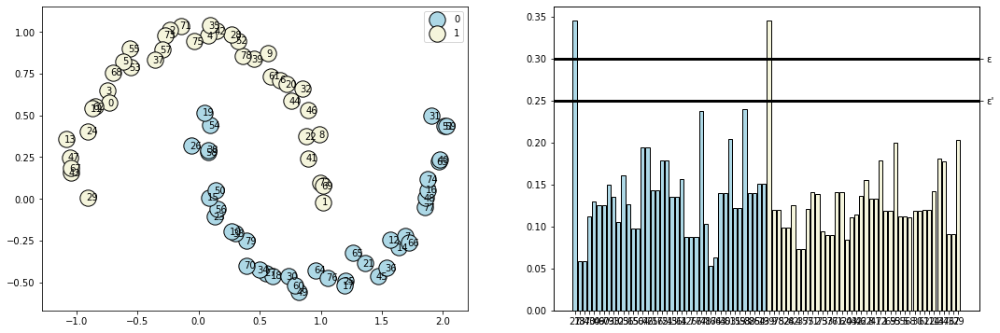

In [852]:
plot_clust(X, ClustDist, CoreDist, eps=0.3, eps_db=0.25)

# DBSCAN

## Functions

In [569]:
def scan_neigh1_mod(data, point, eps):
    
    neigh = {}
    distances = {}
    
    for i, element in enumerate(data.values()):
        
        d = dist1(element, point)
        
        if (d <= eps):
            
            neigh.update({str(i):element})

    return neigh   

In [824]:
def point_plot_mod(X_dict, x,y, eps, ClustDict, clust_id):
    
    colors = {-1:'red', 0:'lightblue', 1:'beige', 2:'yellow', 3:'grey', 
              4:'pink', 5:'navy', 6:'orange', 7:'purple', 8:'salmon', 9:'olive', 10:'brown',
             11:'tan', 12: 'lime'}
    
    fig, ax = plt.subplots(figsize=(14,6))
    
    plt.scatter(X[:,0], X[:,1], s=300, color="lime", edgecolor="black")
    
    for i in ClustDict:
        plt.scatter(X_dict[i][0],X_dict[i][1], color=colors[ClustDict[i]], s=300 )
    
    plt.scatter(x=x,y=y,s=400, color="black", alpha=0.4)
    
    circle1 = plt.Circle((x, y), eps, color='r', fill=False, linewidth=3, alpha=0.7)
    plt.gcf().gca().add_artist(circle1)
    
    xmin, xmax, ymin, ymax = plt.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin
    
    xw1 = xwidth*0.008
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.005
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=12, size=12)
        else:
            ax.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=12, size=12)
    
    plt.show()

In [825]:
def plot_clust_DB(X, ClustDict, eps, circle_class=None, Noise_circle=True):

    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    new_dict = {key: (val1, ClustDict[key]) for key,val1 in zip(list(X_dict.keys()),list(X_dict.values())) }

    new_dict = OrderedDict((k, new_dict[k]) for k in list(ClustDict.keys()))

    df = pd.DataFrame(dict(x = [i[0][0] for i in list(new_dict.values())], 
                 y=[i[0][1] for i in list(new_dict.values())], 
                 label= [i[1]for i in list(new_dict.values())]), index=new_dict.keys())

    colors = {-1:'red', 0:'lightblue', 1:'beige', 2:'yellow', 3:'grey', 
              4:'pink', 5:'navy', 6:'orange', 7:'purple', 8:'salmon', 9:'olive', 10:'brown',
             11:'tan', 12: 'lime'}

    #fig, ax = plt.subplots(figsize=(14,6))
    fig, ax1 = plt.subplots(1, 1, figsize=(18,6))

    grouped = df.groupby('label')

        #for key, group in grouped:

            #group.plot(ax=ax1, kind='scatter', x='x', y='y', label=key, color=colors[key], s=300, edgecolor="black")

    lista_lab = list(df.label.value_counts().index)
    
    for lab in lista_lab:

        df_sub = df[df.label == lab]
        plt.scatter(df_sub.x, df_sub.y, color = colors[lab], s=300, edgecolor="black")

    if Noise_circle == True:

        df_noise = df[df.label == -1]

        for i in range(len(df_noise)):
            
            ax1.add_artist(plt.Circle((df_noise["x"].iloc[i], 
                                       df_noise["y"].iloc[i]), eps, color='r', fill=False, linewidth=3, alpha=0.7))
            
    if circle_class is not None:
        
        if circle_class != "true":
            
            lista_lab = circle_class
        
        for lab in lista_lab:
        
            if lab != -1:
                
                df_temp = df[df.label == lab]
                
                for i in range(len(df_temp)):
            
                    ax1.add_artist(plt.Circle((df_temp["x"].iloc[i], df_temp["y"].iloc[i]), 
                                              eps, color=colors[lab], fill=False, linewidth=3, alpha=0.7))
                
    ax1.set_xlabel("")
    ax1.set_ylabel("")
    
    
    xmin, xmax, ymin, ymax = plt.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin
    
    xw1 = xwidth*0.005
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.0025
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax1.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=8, size=10)
        else:
            ax1.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=8, size=10)


    plt.show()


In [810]:
def DBSCAN(data, eps, minPTS, plotting=False):
        
    ClustDict = {}

    clust_id = -1

    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    processed = []

    processed_list = []

    unprocessed = list(set(list(X_dict.keys())) - set(processed))

    for point in X_dict:

        if point not in processed:

            processed.append(point)

            #print(processed)

            N = scan_neigh1_mod(X_dict, X_dict[point], eps)

            if len(N) < minPTS-1:

                ClustDict.update({point: -1})
                
                if plotting == True:
                    
                    point_plot_mod(X_dict, X_dict[point][0], X_dict[point][1], eps, ClustDict, -1)

            else:

                clust_id+=1

                ClustDict.update({point: clust_id})
                
                if plotting == True:
                
                    point_plot_mod(X_dict, X_dict[point][0], X_dict[point][1], eps, ClustDict, clust_id)

                processed_list = []

                while len(N)>0:

                    n = random.choice(list(N.keys()))

                    while (n in processed_list):

                        n = random.choice(list(N.keys()))

                    processed_list.append(n)

                    del N[n]

                    if n not in processed:

                        processed.append(n)

                        N_2 = scan_neigh1(X_dict, X_dict[n], eps)

                        if len(N_2) >= minPTS-1:

                            for element in N_2:

                                if element not in processed_list:

                                    N.update({element: X_dict[element]})

                    if n not in ClustDict:

                        ClustDict.update({n: clust_id})
                        
                        if plotting == True:
                            
                            point_plot_mod(X_dict, X_dict[n][0], X_dict[n][1], eps, ClustDict, clust_id)
                            
    return ClustDict

## Testing

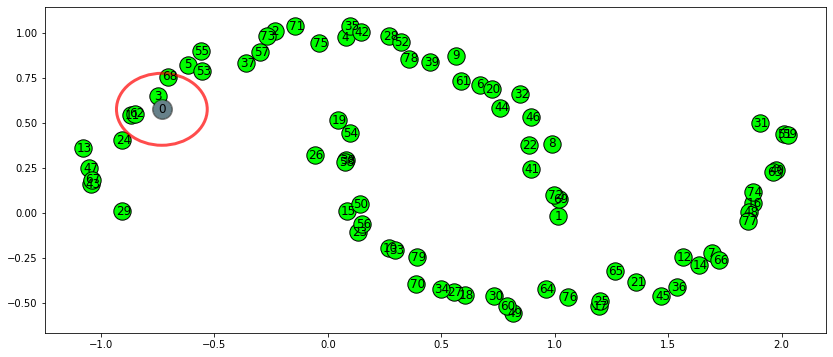

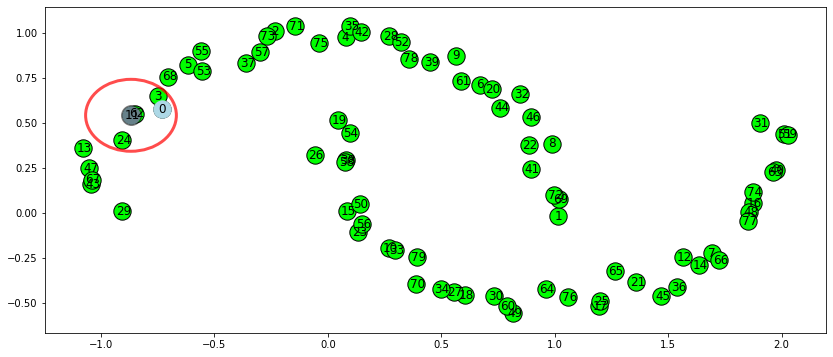

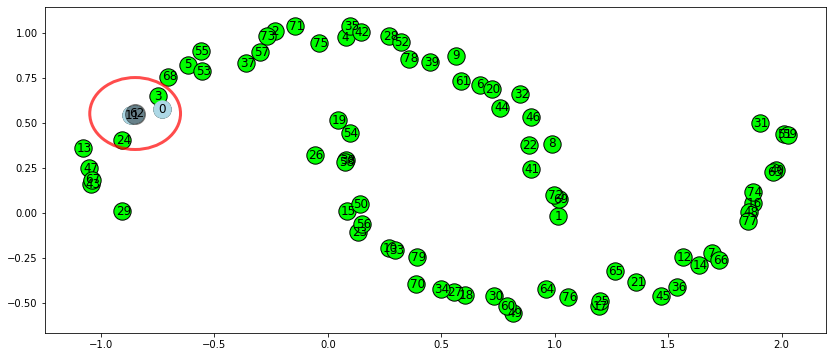

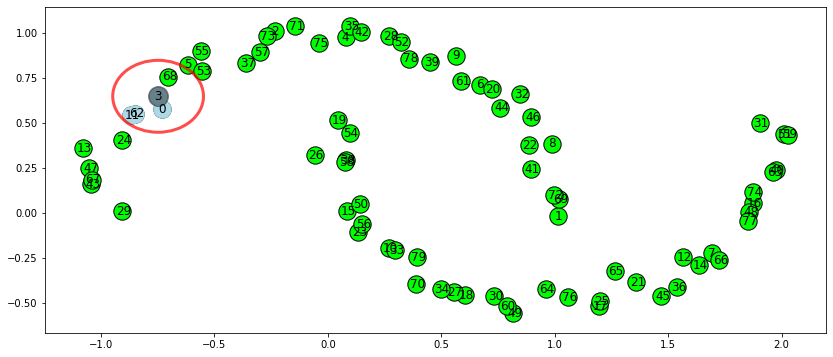

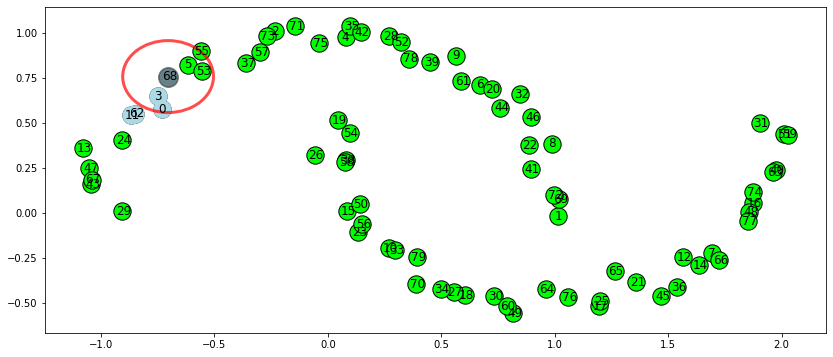

...

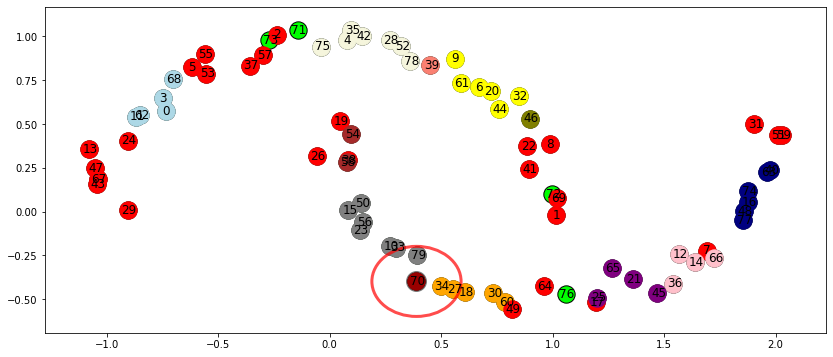

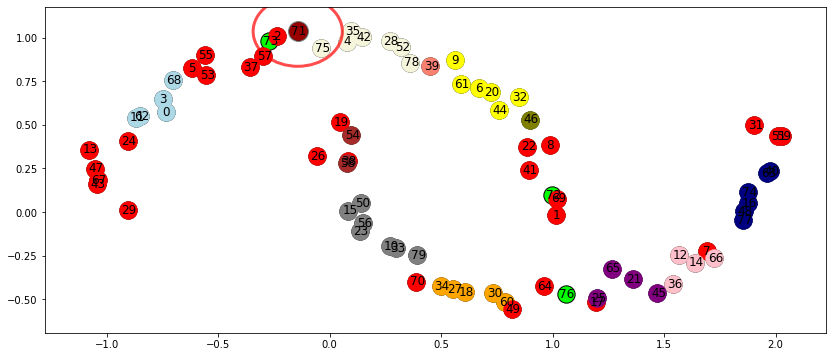

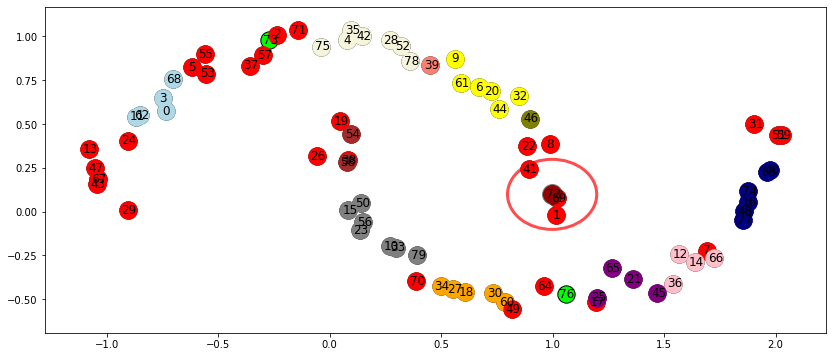

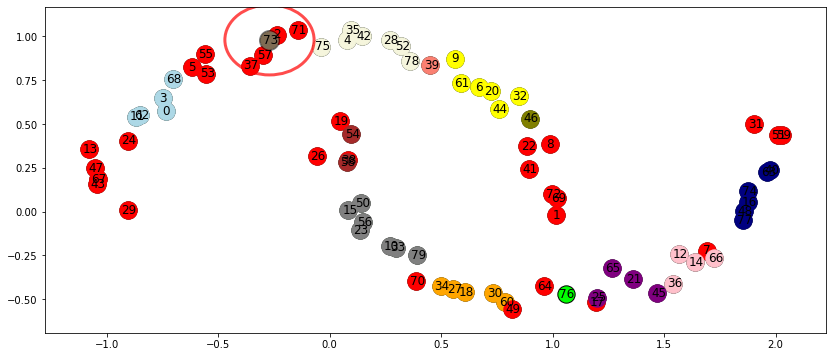

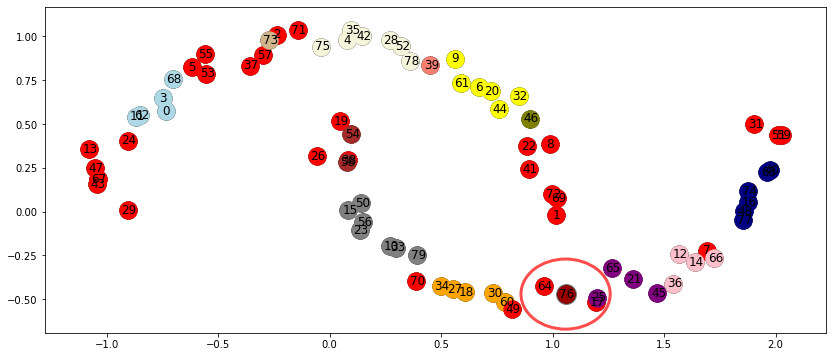

In [827]:
ClustDict = DBSCAN(X, eps=0.2, minPTS=6, plotting=True)

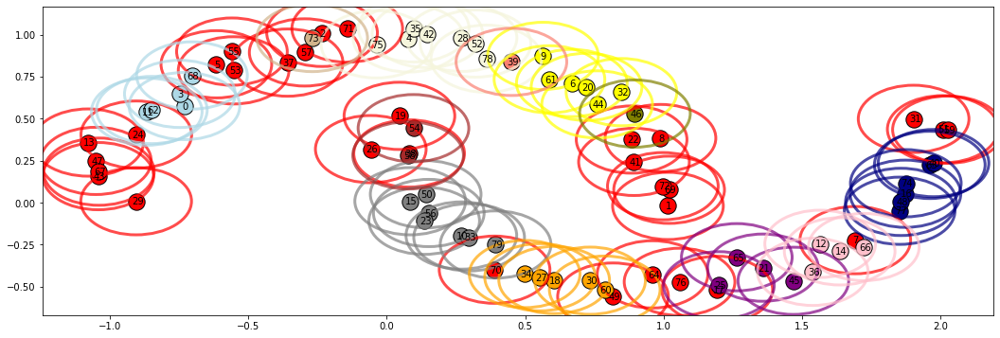

In [830]:
plot_clust_DB(X,ClustDict, 0.2, Noise_circle=True, circle_class="true")

# HDBSCAN

https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html 

In [878]:
import hdbscan

clusterer = hdbscan.HDBSCAN(min_cluster_size=5, gen_min_span_tree=True)
clusterer.fit(X)

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
        approx_min_span_tree=True, cluster_selection_method='eom',
        core_dist_n_jobs=4, gen_min_span_tree=True, leaf_size=40,
        match_reference_implementation=False, memory=Memory(location=None),
        metric='euclidean', min_cluster_size=5, min_samples=None, p=None,
        prediction_data=False)

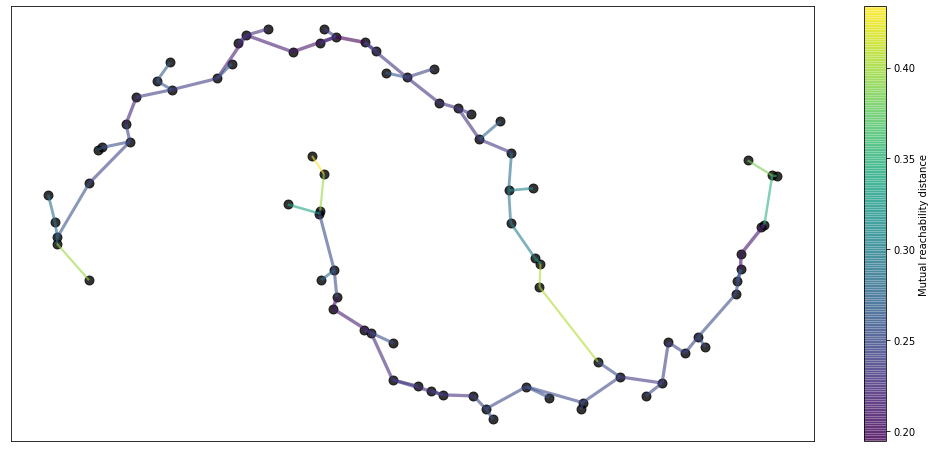

In [879]:
plt.figure(figsize = (18,8))
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=80,
                                      edge_linewidth=2,
                                      )

plt.show()

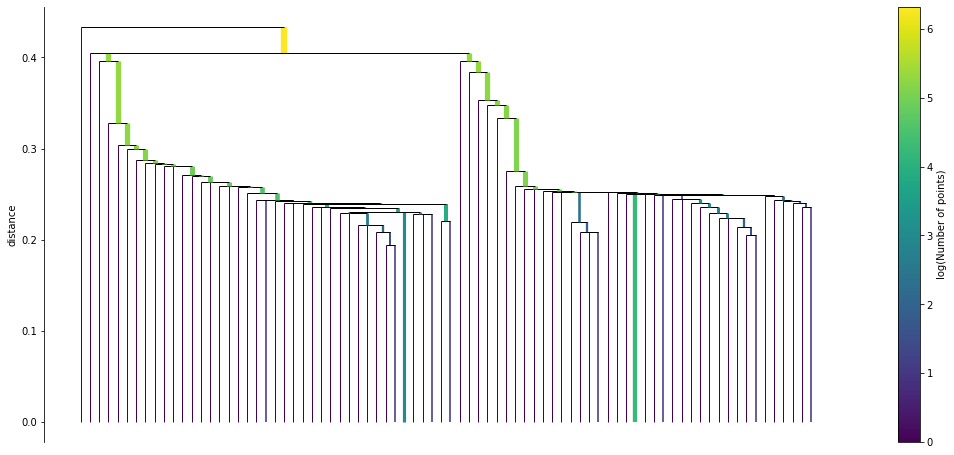

In [892]:
plt.figure(figsize = (18,8))
clusterer.single_linkage_tree_.plot(cmap='viridis', colorbar=True)
plt.show()

In [889]:
np.log2(80)

6.321928094887363

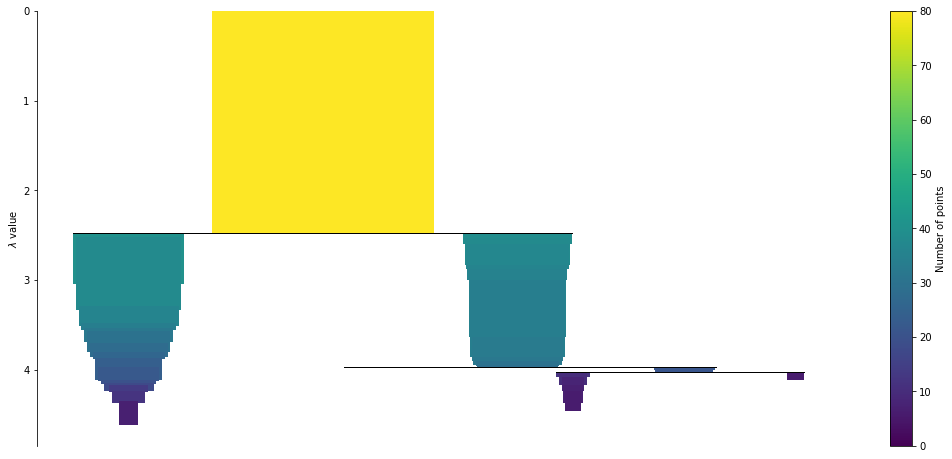

In [881]:
plt.figure(figsize = (18,8))
clusterer.condensed_tree_.plot()
plt.show()

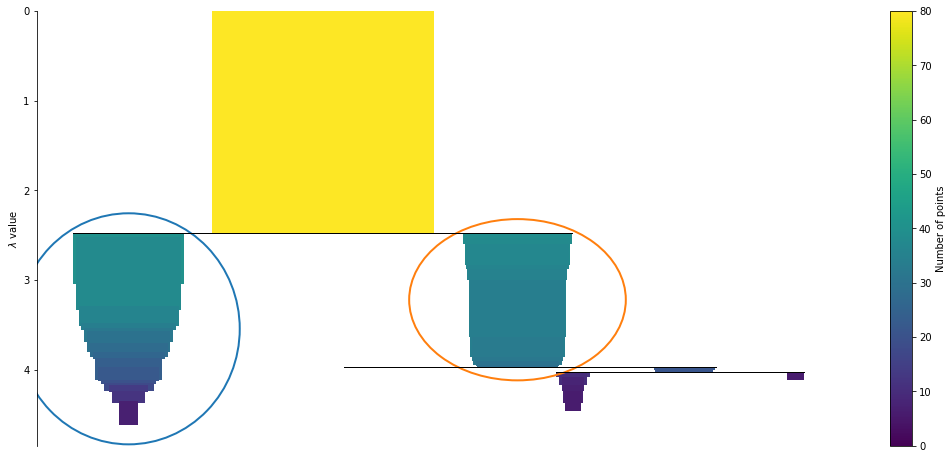

In [891]:
plt.figure(figsize = (18,8))
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())
plt.show()

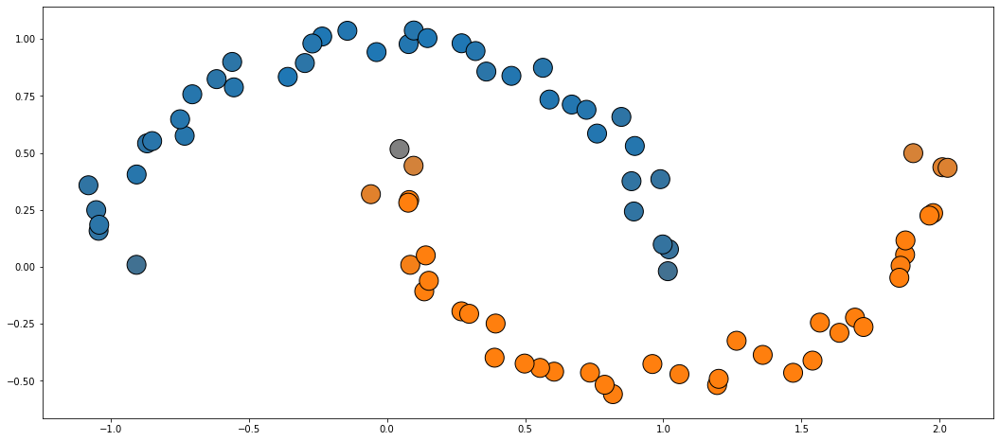

In [883]:
plt.figure(figsize=(18,8))
palette = sns.color_palette()
cluster_colors = [sns.desaturate(palette[col], sat)
                  if col >= 0 else (0.5, 0.5, 0.5) for col, sat in
                  zip(clusterer.labels_, clusterer.probabilities_)]
plt.scatter(X.T[0], X.T[1], c=cluster_colors, s=400, edgecolor="black")
plt.show()